<h1 style="background-color:orange;font-family:newtimeroman;font-size:350%;text-align:center;border-radius: 15px 50px;">Spis treści</h1>


* [1. Wprowadzenie](#1)
    * [1.1 Importy](#1.1)
    * [1.2 Wstępne Wczytywanie Danych](#1.2)
* [2. Analiza Eksploracyjna](#2)
* [3. Data Preprocessing](#3)
    * [3.1 Upsampling wykorzystujący SMOTE](#3.1)
* [4. Uczenie](#4) 
    * [4.1 Metoda KNN](#4.1)
    * [4.2 Drzewo Decyzyjne](#4.2)
* [5. Wnioski](#5) 


<a id="1.1"></a>
<h3 style="background-color:orange;font-family:newtimeroman;font-size:200%;text-align:center;border-radius: 15px 50px;">Importy</h3>

Importujemy wszystkie potrzebne nam biblioteki, oraz instalujemy jakiekolwiek inne które też się nam przydadzą jeśli nie ma ich już w anakondzie.

In [155]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as ex
import plotly.graph_objs as go
import plotly.figure_factory as ff
from plotly.subplots import make_subplots
import plotly.offline as pyo
from seaborn import color_palette
from sklearn.tree import DecisionTreeClassifier

pyo.init_notebook_mode()
sns.set_style('darkgrid')
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split,cross_val_score
from sklearn.ensemble import RandomForestClassifier,AdaBoostClassifier
from sklearn.svm import SVC
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score as f1
from sklearn.metrics import confusion_matrix
from sklearn.neighbors import KNeighborsClassifier

plt.rc('figure',figsize=(18,9))
%pip install imbalanced-learn
from imblearn.over_sampling import SMOTE

<a id="1.2"></a>
<h3 style="background-color:orange;font-family:newtimeroman;font-size:200%;text-align:center;border-radius: 15px 50px;">Wstępne wczytywanie danych</h3>


Tu raczej nie potrzeba długiego opisu, wczytujemy zbiór danych i wyświetlamy pierwsze trzy aby uzyskać pogląd tego na czym w ogóle pracujemy. Odrzucamy także dwie ostatnie kolumny ponieważ są to klasyfikatory Bayesa, które się prowadziłyby do uprzedzenia w uczeniu.

In [156]:
c_data = pd.read_csv('BankChurners.csv')
c_data = c_data[c_data.columns[1:-2]]
c_data.head(3)

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000


<a id="2"></a>
<h1 style="background-color:orange;font-family:newtimeroman;font-size:300%;text-align:center;border-radius: 15px 50px;">Exploratory Data Analysis</h1>


Tworzymy wykresy dla wszystkich zbiorów danych, na których możemy zauważyć (z mniej oczywistych cech niż na przykład standardowy rozkład wiekowy), że większość klientów jest klasy niebieskiej i niewielka część srebrnej, natomiast klienci klasy platynowej albo złotej stanowią raczej nikły procent reszty. Z samych wykresów możemy powiązać że klienci z niższymi liczbami odnoszącymi się do bankowości (na przykład stan konta, kwoty tranzakcji albo icch liczba) są niższe u klientów opuszczających bank, inne cechy mają raczej podobne rozkłady dla klientów i zostających i opuszczających bank.

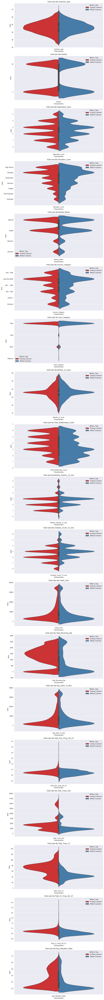

In [157]:
data_div = pd.melt(c_data, id_vars='Attrition_Flag', var_name="Characteristics")

fig, axes = plt.subplots(len(c_data.columns) - 1, 1, figsize=(10, 5 * (len(c_data.columns) - 1)))

for i, column in enumerate(c_data.drop("Attrition_Flag", axis=1).columns):
    ax = axes[i]
    sns.violinplot(x="Characteristics", y="value", hue="Attrition_Flag", data=data_div[data_div["Characteristics"] == column], palette="Set1", split=True, ax=ax)
    ax.set_title(f"Violin plot dla {column}")

plt.tight_layout()
plt.show()

Dla atrybutów opisanych symbolicznie przypisujemy wartości liczbowe, aby ułatwić skorzystanie z nich przy uczeniu maszynowym.
Przyporządkowanie wartości tekstowych do liczb dla Attrition_Flag:
Attrited Customer -> 0
Existing Customer -> 1

Przyporządkowanie liter do liczb dla Gender:
F -> 0
M -> 1

Przyporządkowanie liter do liczb dla Education_Level:
College -> 0
Doctorate -> 1
Graduate -> 2
High School -> 3
Post-Graduate -> 4
Uneducated -> 5
Unknown -> 6

Przyporządkowanie liter do liczb dla Marital_Status:
Divorced -> 0
Married -> 1
Single -> 2
Unknown -> 3

Przyporządkowanie liter do liczb dla Income_Category:
$120K + -> 0
...
Gold -> 1
Platinum -> 2
Silver -> 3

Wyświetlamy też head nowych danych więc można zobaczyć efekt.

In [158]:

from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()

columns_to_encode = ['Attrition_Flag', 'Gender', 'Education_Level', 'Marital_Status', 'Income_Category', 'Card_Category']

for column in columns_to_encode:
    c_data[column] = label_encoder.fit_transform(c_data[column])

    print(f"Przyporządkowanie wartości tekstowych do liczb dla {column}:")
    for label, encoded_value in zip(label_encoder.classes_, label_encoder.transform(label_encoder.classes_)):
        print(f"{label} -> {encoded_value}")
    print()
    
c_data.head(3)

Przyporządkowanie wartości tekstowych do liczb dla Attrition_Flag:
Attrited Customer -> 0
Existing Customer -> 1

Przyporządkowanie wartości tekstowych do liczb dla Gender:
F -> 0
M -> 1

Przyporządkowanie wartości tekstowych do liczb dla Education_Level:
College -> 0
Doctorate -> 1
Graduate -> 2
High School -> 3
Post-Graduate -> 4
Uneducated -> 5
Unknown -> 6

Przyporządkowanie wartości tekstowych do liczb dla Marital_Status:
Divorced -> 0
Married -> 1
Single -> 2
Unknown -> 3

Przyporządkowanie wartości tekstowych do liczb dla Income_Category:
$120K + -> 0
$40K - $60K -> 1
$60K - $80K -> 2
$80K - $120K -> 3
Less than $40K -> 4
Unknown -> 5

Przyporządkowanie wartości tekstowych do liczb dla Card_Category:
Blue -> 0
Gold -> 1
Platinum -> 2
Silver -> 3



,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,1,45,1,3,3,1,2,0,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,1,49,0,5,2,2,4,0,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,1,51,1,3,2,1,3,0,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000


Generujemy heatmapę korelacji dla podmienionych już wartości, z której widzimy dużą korelację między wiekiem klientów a liczbą miesięcy w banku (ale to raczej przypadkowa zbieżność przeciętnego wieku klienta z przeciętną długością bycia klientem), oraz liczby transakcji między ich sumą. o więcej, atrybuty Credit_Limit i Avg_Open_To_Buy mają korelację równą 1, więc decydujemy się odrzucić Avg_Open_To_Buy

<Axes: >

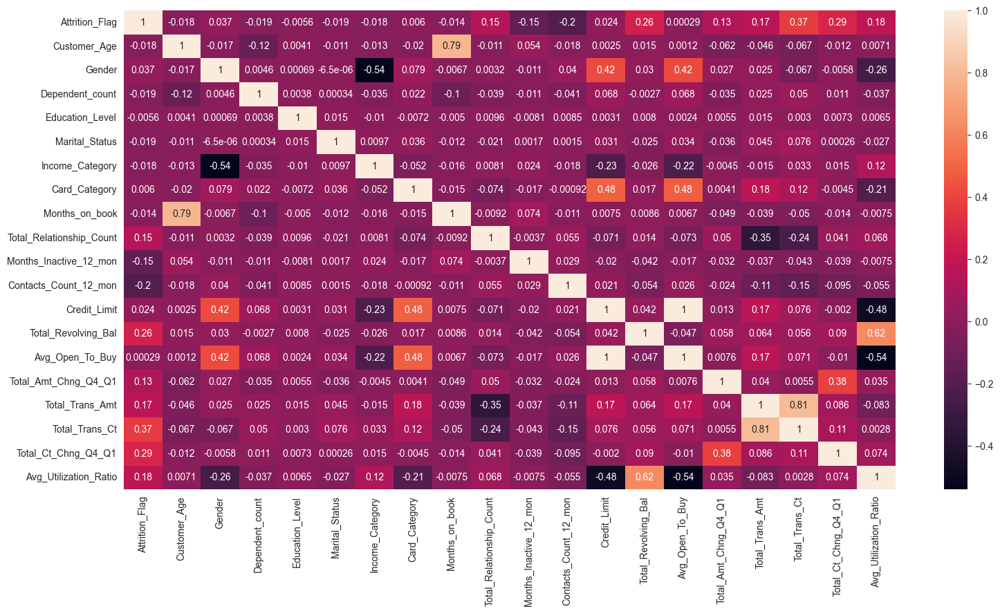

In [159]:
sns.heatmap(data=c_data.corr(), annot=c_data.corr())


Tutaj wyświetlamy wykresy rozkładu zbierzności poszczególnych cech, potwierdzające nasze wcześniejsze wnioski. Na wykresach możemy łatwo wyróżnić przestrzenie gdzie klienci nie opuszczają banku, ale ciężej o wyróżnienie przestrzeni gdzie przeważnie opuszczają bank. Z punktu widzenia biznesowego, przewidzenie nadmiaru klientów którzy opuszczą bank jest lepsze więc nie jest to zła sytuacja.

<Figure size 1000x1000 with 0 Axes>

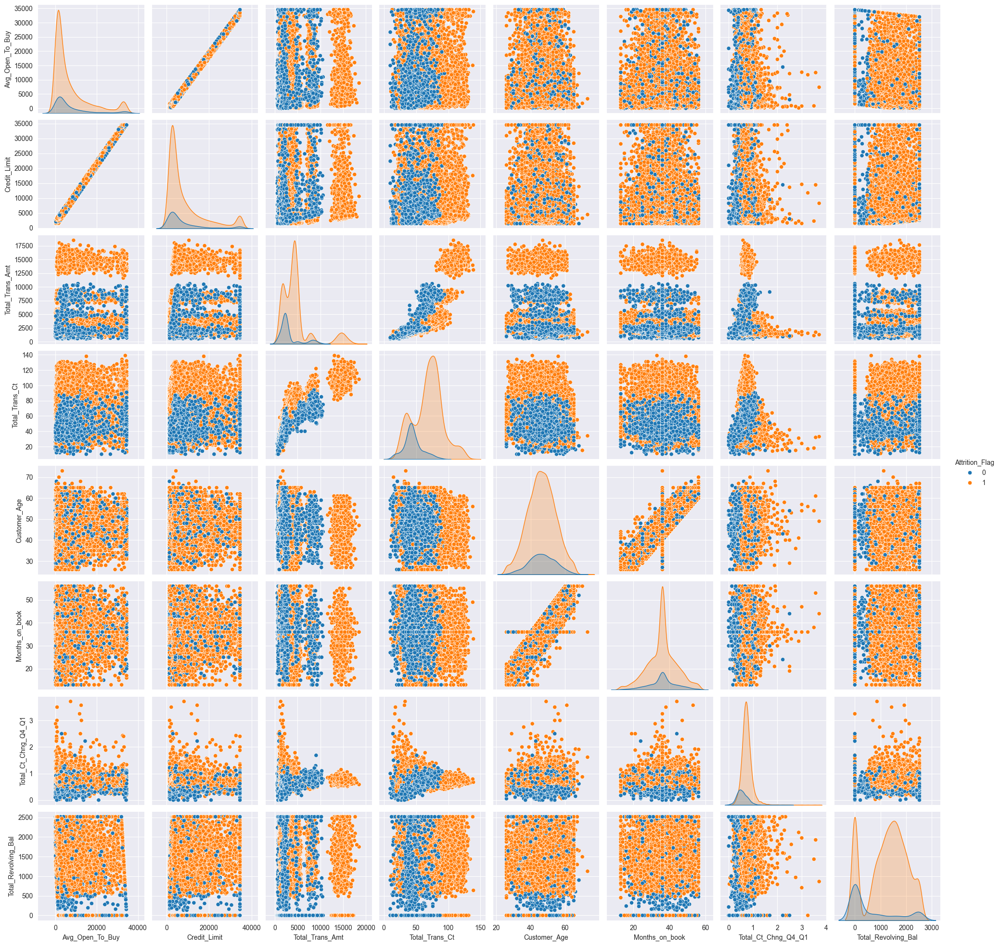

In [160]:
plt.figure(figsize=(10,10), dpi = 100)
sns.pairplot(data=c_data[['Attrition_Flag', 'Avg_Open_To_Buy', 'Credit_Limit', 'Total_Trans_Amt', 'Total_Trans_Ct', 'Customer_Age', 'Months_on_book', 'Total_Ct_Chng_Q4_Q1', 'Total_Revolving_Bal']], kind='scatter', hue='Attrition_Flag')


Tutaj odrzucamy Atrybuty Avg_Open_To_Buy. Nie odrzucamy innych wysoko skorelowanych cech, ponieważ metody uczenia które wykorzystamy nie odczują negatywnie ich obecności niż gdybyśmy na przykład używali na przykład modelu regresji liniowej.

<Axes: >

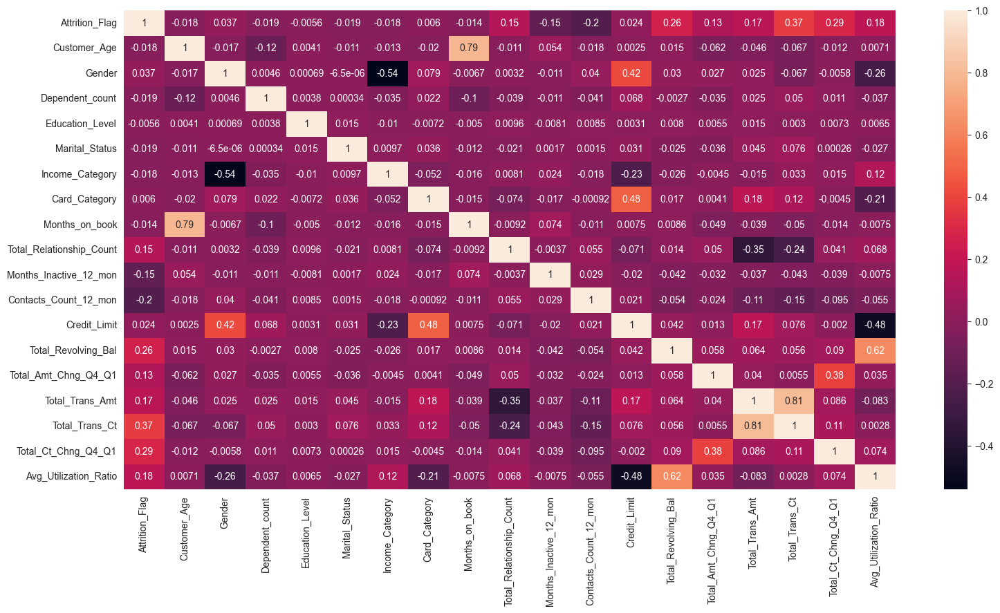

In [161]:

if 'Avg_Open_To_Buy' in c_data.columns:
    c_data = c_data.drop(columns=['Avg_Open_To_Buy'])
    
sns.heatmap(data=c_data.corr(), annot=c_data.corr())

<a id="1.2"></a>
<h3 style="background-color:orange;font-family:newtimeroman;font-size:200%;text-align:center;border-radius: 15px 50px;">Upsampling</h3>

Wyświetlamy ile klientów w ogóle opuszcza bank, jak widać jest to tylko 16% zbioru, co może utrudniać nam przewidywania. Z tego powodu użyjemy SMOTE aby wyrównać mniej więcej te liczby aby wybrane modele lepiej sobie radziły.

In [162]:
ex.pie(c_data,names='Attrition_Flag',title='Proportion of churn vs not churn customers',hole=0.33)

Ponieważ nie było to omówione na zajęciach: To technika rozwiązująca problem niezbalansowanych klas, przez które modele uczenia mogłyby nie wyłapywać szczegółów podziału, i jak zobaczymy zwiększa dość znacząco skuteczność modeli. Zamiast duplikować po prostu przypadki, tworzy "wymyślone" przykłady na podstawie istniejącej mniejszości oraz jej sąsiadów do niej należących.

In [163]:
oversample = SMOTE()
X, Y = oversample.fit_resample(c_data[c_data.columns[1:]], c_data[c_data.columns[0]])
usampled_df = X.assign(Churn = Y)

na początku próbowaliśmy odrzucić kilka dalej wysoko skorelowanych kolumn, ale i tak wpłynęło to negatywnie na wyniki więc się z tego wycofaliśmy.

In [164]:
#ohe_data =usampled_df[usampled_df.columns[15:-1]].copy()

#usampled_df = usampled_df.drop(columns=usampled_df.columns[15:-1])
usampled_df.head(3)


,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Churn
0,45,1,3,3,1,2,0,39,5,1,3,12691.0,777,1.335,1144,42,1.625,0.061,1
1,49,0,5,2,2,4,0,44,6,1,2,8256.0,864,1.541,1291,33,3.714,0.105,1
2,51,1,3,2,1,3,0,36,4,1,0,3418.0,0,2.594,1887,20,2.333,0.000,1


Jak widać po użyciu SMOTE Atrybut Churn jest podzielony połowicznie między wartościami, a macierz korelacji nie zmieniła się zbytnio. Następnie będziemy mogli porównać wpływ tej techniki na efektywność modeli k najbliższych sąsiadów oraz drzewa decyzyjnego.

In [165]:
fig = make_subplots(rows=1, cols=1,shared_xaxes=True,subplot_titles=('Perason Correaltion',  'Spearman Correaltion'))
colorscale=     [[1.0              , "rgb(165,0,38)"],
                [0.8888888888888888, "rgb(215,48,39)"],
                [0.7777777777777778, "rgb(244,109,67)"],
                [0.6666666666666666, "rgb(253,174,97)"],
                [0.5555555555555556, "rgb(254,224,144)"],
                [0.4444444444444444, "rgb(224,243,248)"],
                [0.3333333333333333, "rgb(171,217,233)"],
                [0.2222222222222222, "rgb(116,173,209)"],
                [0.1111111111111111, "rgb(69,117,180)"],
                [0.0               , "rgb(49,54,149)"]]

s_val =usampled_df.corr('pearson')
s_idx = s_val.index
s_col = s_val.columns
s_val = s_val.values
fig.add_trace(
    go.Heatmap(x=s_col,y=s_idx,z=s_val,name='pearson',showscale=False,xgap=1,ygap=1,colorscale=colorscale),
    row=1, col=1
)
fig.update_layout(
    hoverlabel=dict(
        bgcolor="white",
        font_size=16,
        font_family="Rockwell"
    )
)
fig.update_layout(height=700, width=900, title_text="Upsmapled Correlations")
fig.show()

ex.pie(usampled_df,names='Churn',title='Proporcja byłych klientów do normalnych',hole=0.33)



Tutaj także widzimy rozkład z syntetycznymi rekordami, jak widać od niezmodyfikowanych danych różnią się głównie ilością niebieskich punktów, nie ich rozmieszczeniem.

<Figure size 1000x1000 with 0 Axes>

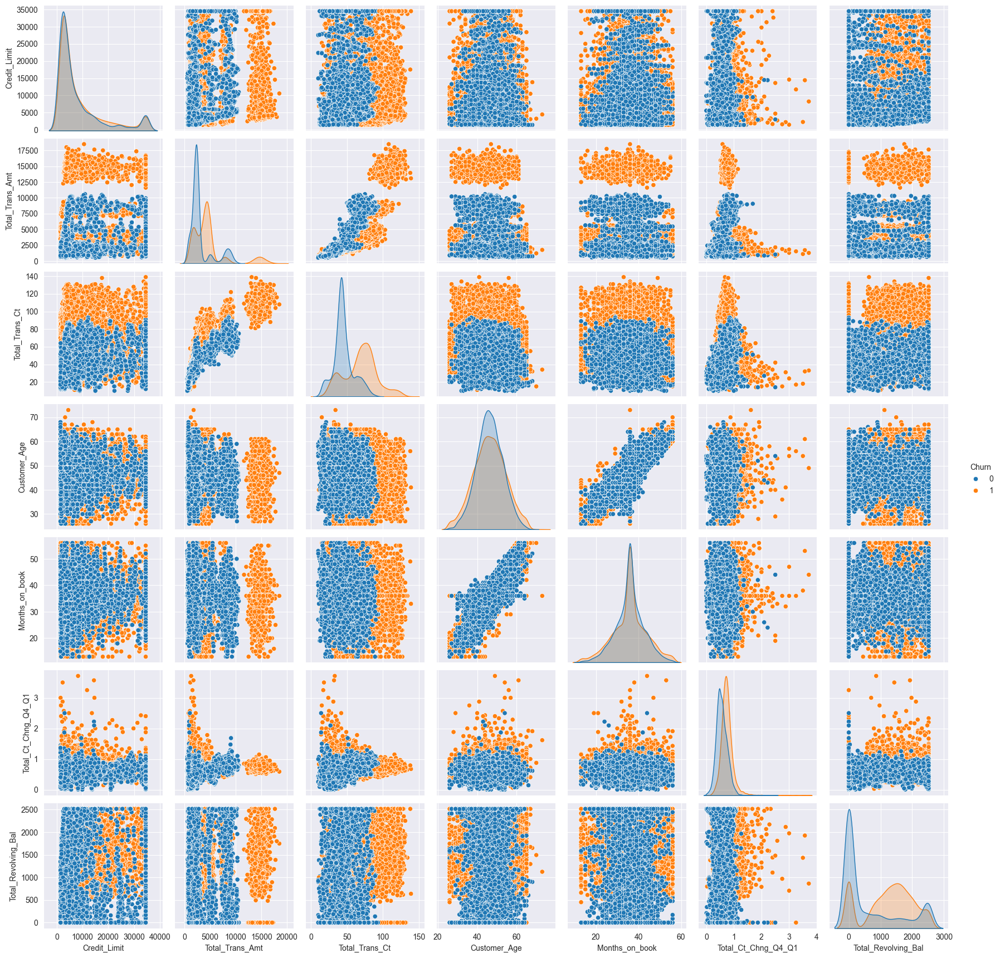

In [166]:
plt.figure(figsize=(10,10), dpi = 100)
sns.pairplot(data=usampled_df[['Churn', 'Credit_Limit', 'Total_Trans_Amt', 'Total_Trans_Ct', 'Customer_Age', 'Months_on_book', 'Total_Ct_Chng_Q4_Q1', 'Total_Revolving_Bal']], kind='scatter', hue='Churn')


tu dzielimy dataset

<a id="1.2"></a>
<h3 style="background-color:orange;font-family:newtimeroman;font-size:400%;text-align:center;border-radius: 15px 50px;">Uczenie</h3>

In [167]:
def podziel(X, Y):
  X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size = 0.3)
  return {"X_train":X_train, "X_test":X_test, "Y_train":Y_train, "Y_test":Y_test}
def ogolna_dokladnosc(confusion_matrix, df):
    wszystkie = len(df['Y_test'])
    trafione = confusion_matrix[0][0] + confusion_matrix[1][1]
    return (trafione/wszystkie)*100
def dokladnosc_attried(confusion_matrix):
    wszystkie = confusion_matrix[0][0] + confusion_matrix[0][1]
    trafione = confusion_matrix[0][0]
    return (trafione/wszystkie)*100
def procent_nadmiarowych(confusion_matrix):
    wszystkie = confusion_matrix[1][0] + confusion_matrix[1][1]
    nadmiarowe = confusion_matrix[1][0]
    return (nadmiarowe/wszystkie)*100

def learn(df, class_column, graph_title, classifier_type):
    X = df.drop([class_column], axis=1)
    Y = df[class_column]
    d = podziel(X, Y)

    classifier_func = lambda n: KNeighborsClassifier(n_neighbors=n) if classifier_type == "knn" else DecisionTreeClassifier(max_depth=n)
    dokładnosci_attried = {}
    nadmiarowe = {}
    for i in range(1, 30, 1):
        model = classifier_func(i)
        model = model.fit(d["X_train"], d["Y_train"])
        model_predict = model.predict(d["X_test"])
        matrix = confusion_matrix(d["Y_test"], model_predict)
        nadmiarowe.update({i: procent_nadmiarowych(matrix)})
        dokładnosci_attried.update({i: dokladnosc_attried(matrix)})

    fig = make_subplots(rows=1)

    fig.add_trace(
        go.Scatter(x=list(nadmiarowe.keys()), y=list(nadmiarowe.values()), name='Nadmiarowe trafienia [%]'),
        row=1, col=1
    )
    fig.add_trace(
        go.Scatter(x=list(dokładnosci_attried.keys()), y=list(dokładnosci_attried.values()), name='Prawidłowe trafienia attried [%]'),
        row=1, col=1
    )

    fig.update_layout(height=700, width=900, title_text=graph_title)
    fig.update_yaxes(title_text="Dokładność [%]")
    fig.update_xaxes(title_text="K")

    fig.show()

    best_k = max(dokładnosci_attried, key=dokładnosci_attried.get)

    model = classifier_func(best_k)
    model = model.fit(d["X_train"], d["Y_train"])
    model_predict = model.predict(d["X_test"])
    matrix = matrix(d["Y_test"], model_predict)

    fig, axes = plt.subplots()

    sns.heatmap(matrix, annot=True, fmt='d', cmap="YlGnBu", linewidths=0.5, cbar=False, xticklabels=("Attried", "Existing"), yticklabels=("Attried", "Existing"))
    axes.set_title('Macierz pomyłek')
    axes.set_ylabel('Prawdziwe wartości')
    axes.set_xlabel('Przewidziane wartości')

    dokladnosc = dokladnosc_attried(matrix)
    nadmiarowe = procent_nadmiarowych(matrix)
    if classifier_type == "knn":
        print("Dokładność klasyfikacji " + str(best_k) + "-NN: " + str(dokladnosc) + "%")
        print("Nadmiarowe trafienia klasyfikacji " + str(best_k) + "-NN: " + str(nadmiarowe) + "%")
    else:
        print("Dokładność klasyfikacji DT o głębokości " + str(best_k) + ": " + str(dokladnosc) + "%")
        print("Nadmiarowe trafienia klasyfikacji DT o głębokości " + str(best_k) + ": " + str(nadmiarowe) + "%")
    plt.show()


<a id="1.2"></a>
<h3 style="background-color:orange;font-family:newtimeroman;font-size:200%;text-align:center;border-radius: 15px 50px;">Metoda K-NN</h3>

Dokładność klasyfikacji 2-NN: 73.4251968503937%
Nadmiarowe trafienia klasyfikacji 2-NN: 12.564203871987356%


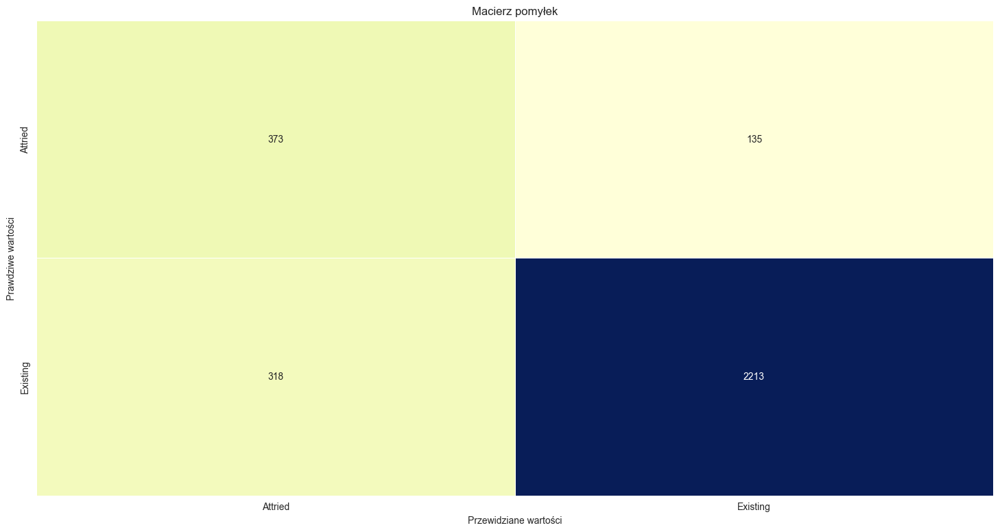

Dokładność klasyfikacji 2-NN: 98.05144193296961%
Nadmiarowe trafienia klasyfikacji 2-NN: 18.50828729281768%


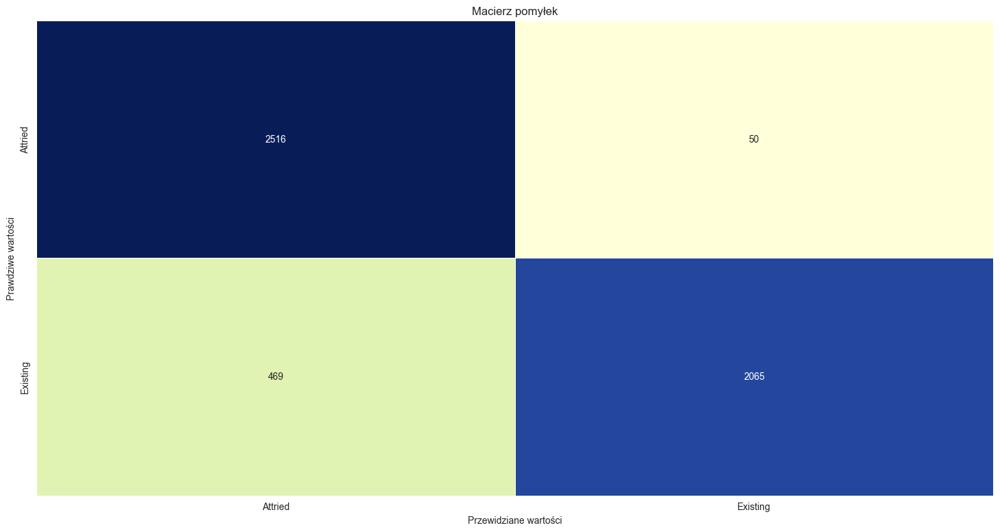

In [168]:
learn(c_data, 'Attrition_Flag', "Original data", "knn")
learn(usampled_df, 'Churn', "Upsampled Data", "knn")

<a id="1.2"></a>
<h3 style="background-color:orange;font-family:newtimeroman;font-size:200%;text-align:center;border-radius: 15px 50px;">Drzewo decyzyjne</h3>

Dokładność klasyfikacji DT o głębokości 9: 82.82208588957054%
Nadmiarowe trafienia klasyfikacji DT o głębokości 9: 2.980392156862745%


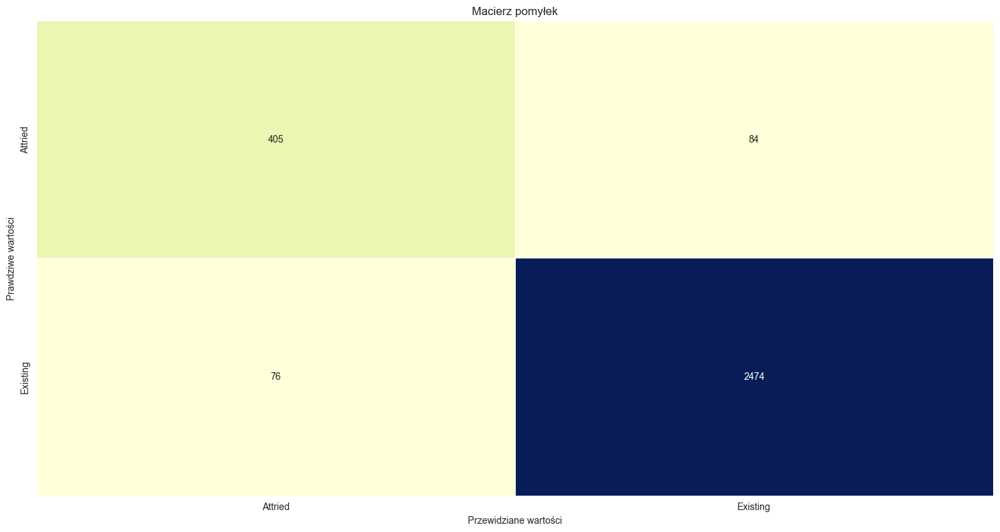

Dokładność klasyfikacji DT o głębokości 12: 96.15384615384616%
Nadmiarowe trafienia klasyfikacji DT o głębokości 12: 5.916927899686521%


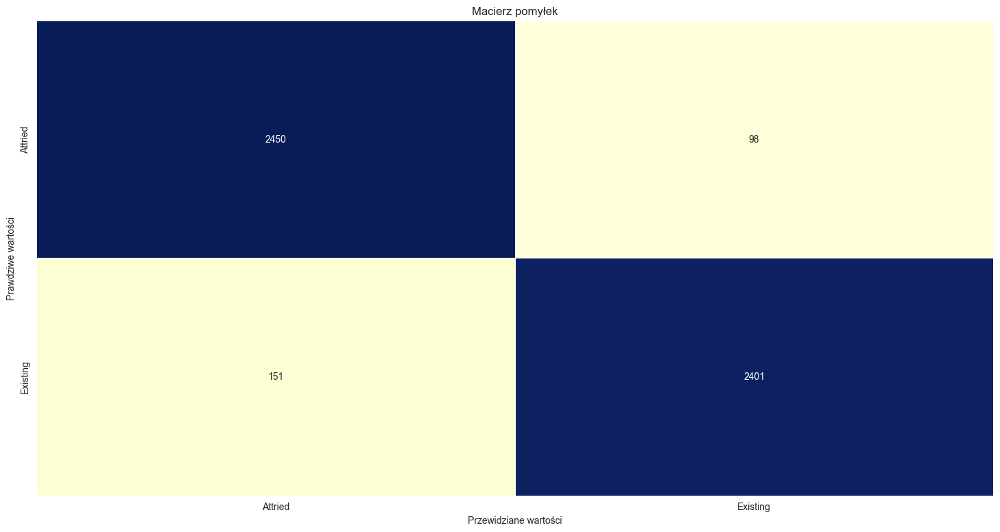

In [169]:
learn(c_data, 'Attrition_Flag', "Original data", "dt")
learn(usampled_df, 'Churn', "Upsampled Data", "dt")

<a id="5"></a>
<h3 style="background-color:orange;font-family:newtimeroman;font-size:200%;text-align:center;border-radius: 15px 50px;">Wnioski</h3>

Jak widać na wyżej wygenerowanych macierzach oraz wykresach modele używające danych poprawionych za pomocą SMOTE Odznaczały się o wiele wyższą celnością modelu, i o ile miały odrobinę wyższy współczynnik nadmiarowych trafień (czego nie możemy odrzucić jako model przewidujący klientów którzy opuszczą niedługo bank) to biorąc pod uwagę ilość dodanych rekordów procentowo odznaczały się o wiele niższą liczbą byłych klientów oznaczonych jako dalsi klienci. W przypadku metody k najbliższych sąsiadów ta ilość była mniejsza nie tylko procentowo, a nawet ilościowo. W przypadku wykorzystania techniki SMOTE metoda k najbliższych sąsiadów wykazała się wyższą dokładnością od metody drzewa decyzyjnego, ale miała też prawie 20% nadmiarowych trafień. W porównaniu metoda drzewa decyzyjnego straciła jedynie 2 procent dokładności, ale miała też 4 razy mniej nadmiarowych trafień. Natomiast w przypadku dania modelom oryginalnych danych metoda drzewa decyzyjnego okazała się lepsza pod każdym względem.